In [496]:
#!M
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from io import BytesIO
import operator
import cv2
import urllib.request

from scipy.spatial import distance
import requests
from scipy.fftpack import fft, dct

from tqdm.notebook import tqdm
from ipywidgets import IntProgress
from tqdm import tqdm

import codecs, json 
import pprint
import collections

import warnings
warnings.filterwarnings("ignore")

In [546]:
#!M
URL = 'https://api.ratengoods.com/api/v0.10/image/'

In [491]:
#!M
data = pd.read_csv('data.csv')
data['links'] = 'https://storage.yandexcloud.net/images.ratengoods.com/1/' + data.name
data.drop(columns=['Unnamed: 0'], inplace=True)
data

,key,name,source,prod_id,free_use,links
0,8732978,e214c0de5ab3134d7a8f918155af56826fe2872f.jpeg,USER,9489403.0,True,https://storage.yandexcloud.net/images.ratengo...
1,8722550,f010addceda8b3f61c2058023cba3aa3e4ff9842.jpeg,USER,2015371.0,True,https://storage.yandexcloud.net/images.ratengo...
2,8746670,0d378faeca33719cc5d2590a8ae0c018cd509885.jpeg,USER,8241001.0,True,https://storage.yandexcloud.net/images.ratengo...
3,8659332,a73d8495b5ccf2ce690690c3efad6739a8810b06.jpeg,USER,633711.0,True,https://storage.yandexcloud.net/images.ratengo...
4,8920811,36fa2a9a9dab9568ffc8de3a7c255ec0a6e8b28f.jpeg,USER,6633365.0,True,https://storage.yandexcloud.net/images.ratengo...
...,...,...,...,...,...,...
11971636,29641764,f87263deedd3a987140a6aa509e17aeec75b70b1.jpeg,USER,30457782.0,True,https://storage.yandexcloud.net/images.ratengo...
11971637,10638583,a124fec9f68a57793c01133aebc2c605783249f1.jpeg,RNG,27936673.0,False,https://storage.yandexcloud.net/images.ratengo...
11971638,10638583,fa956e64bdb4b1862c24890da42d4e710dbea0e9.jpeg,RNG,27936673.0,False,https://storage.yandexcloud.net/images.ratengo...
11971639,8666753,d97d3b03692fad5694680c6288c10a4b486240f8.png,USER,717945.0,True,https://storage.yandexcloud.net/images.ratengo...


/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'str'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'tuple'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'str'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}


In [466]:
#!M
def DCT_quantization(imgs):
    
    DCTs = []

    for img in imgs:
        
        DCT = dct(img, type=2, norm='ortho')
        
        DCTs.append(quantization(DCT))
        
    return DCTs

In [467]:
#!M
def crop(link):
    
    imgs = []
    
    im = Image.open(BytesIO(requests.get(link).content)).resize((320,320)).convert('L')
    
    for i in range(40):
        for j in range(40):
            
            im1 = im.crop((8*j, 8*i, 8*(j+1), 8*(i+1)))
        
            imgs.append(im1)
            #print(dct(im1, type=2, norm='ortho').shape)
            
    return imgs

In [468]:
#!M
def imgshow(link):
    return Image.open(BytesIO(requests.get(link).content)).resize((320,320)).convert('L')

In [469]:
#!M
def quantization(matrix):
    
    matrix_of_quantization = np.array([
        [3,2,2,3,5,6,10,12],
        [2,2,3,4,5,12,12,11],
        [3,3,3,5,8,11,14,11],
        [3,3,4,6,10,17,16,12],
        [4,4,7,11,14,22,21,15],
        [5,7,11,13,16,21,23,18],
        [10,13,16,17,21,24,24,20],
        [14,18,19,20,22,20,21,20]
    ])
    
    result = np.array(matrix / matrix_of_quantization)
    
    res = result.mean() - result[0][0]/result.mean()
    
    result[result>=res] = 1
    result[(result<res) & (result!=1)] = 0

    
    return result

In [470]:
#!M
def distances(x, y):
    return distance.hamming(np.array(x).flatten(), np.array(y).flatten())

In [471]:
#!M
def do_all(link1, link2):
    
    im1 = DCT_quantization(crop(link1))
    im2 = DCT_quantization(crop(link2))

    return (distances(im1, im2))

In [517]:
#!M
ids = [2035578,
236751,
2039041,
240099,
6092452,
8575738,
8100475,
3463064,
2035577,
8393179,
3240171,
240103,
12229855,
6280108,
1393840,
8672706,
2035654,
237130,
9274114,
1931759,
3741323,
240256,
2039125,
6311154,
1374413,
25378508,
3601824,
956780,
5969594,
2278831,
2270903,
96669,
2827084,
8100094,
240233,
6306467,
2412168,
2446737,
570163,
5979951,
1402036,
2985767,
1393899,
8102689,
8100319,
2799982,
2800091,
2956251,
9085622,
726456,
3080067,
3239963,
1293961,
24913567,
3083685,
9823489,
2800086,
8577273,
8381201,
239889,
3904450,
9842899,
236600,
8100058,
1394500,
6280118,
8100085,
24943151,
672779,
960669,
2417047,
8366748,
1394502,
24509431,
8100001,
1044884,
5979669,
579297,
8100741,
1931290,
2182608,
2850668,
26975648,
6167112,
3771629,
23812916,
948513,
2205202,
1212481,
4002215,
2437030,
2035601,
6316005,
3771627,
6276368,
29061953,
8102695,
2035674,
2800107,
8393458]

In [533]:
#!M
data_top = pd.DataFrame({'prod_id': ids})
data_top

,prod_id
0,2035578
1,236751
2,2039041
3,240099
4,6092452
...,...
95,29061953
96,8102695
97,2035674
98,2800107


In [534]:
#!M
data_top = pd.merge(data, data_top, on='prod_id').dropna()
data_top = data_top[data_top.free_use == True]
data_top.prod_id = data_top.prod_id.astype(int)
data_top

,key,name,source,prod_id,free_use,links
0,8732988,c955fc4fe3e6df90c81d36fdb48c551c3fac38fc.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
1,8105862,804dd5ddd62d6456d98818b478bb4a33022c535e.jpeg,roskontrol,2035577,True,https://storage.yandexcloud.net/images.ratengo...
2,8436100,0574ff9f383cbea9d84f9ae6ff74befd51bc9bde.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
3,8814463,71c4d8d914249e4f775beb841e65819f96cdf81c.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
4,9220185,ef94d09054a6c096266a12b045d3657fce4414cf.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
...,...,...,...,...,...,...
27816,29161577,2539a22683f6baf4645881c14c95bcc7023202c2.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...
27817,29161577,d880e8539300b57300ee757e0a1356d6793a335f.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...
27818,29161577,fcb6cf993dc3cf417363605c9557b5b2921ab2dc.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...
27819,29161577,00c955e8306622a6765fd9bcdb3ce47e5258a6b3.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...


In [520]:
#!M
set(data_top.prod_id.unique().astype(int)) == set(ids)

True

In [535]:
#!M
data_top_notUser = data_top[data_top.source != 'USER']
data_top_notUser = data_top_notUser.reset_index().drop(columns=['index'])
data_top_notUser

,key,name,source,prod_id,free_use,links
0,8105862,804dd5ddd62d6456d98818b478bb4a33022c535e.jpeg,roskontrol,2035577,True,https://storage.yandexcloud.net/images.ratengo...
1,8105862,7d87bd7fbe05df1d7908b31484b495b568f1f377.jpeg,roskontrol,2035577,True,https://storage.yandexcloud.net/images.ratengo...
2,8105862,5d817800ebf88c598870812fd2d4e008e39c0a80.jpeg,roskontrol,2035577,True,https://storage.yandexcloud.net/images.ratengo...
3,8105862,410739110f303a2a0ca0bc1ad65b290701b1f0fc.jpeg,roskontrol,2035577,True,https://storage.yandexcloud.net/images.ratengo...
4,8105862,83e28d34870b0a8b89292021a637a9c810fdb04f.jpeg,roskontrol,2035577,True,https://storage.yandexcloud.net/images.ratengo...
...,...,...,...,...,...,...
148,19111220,b84093ba17fbdfd2db0d3164897596ce057f03af.jpeg,ROSKACHESTVO,8381201,True,https://storage.yandexcloud.net/images.ratengo...
149,19111220,ad06d3f8c5493aadde072867e35388eb265fee8d.jpeg,ROSKACHESTVO,8381201,True,https://storage.yandexcloud.net/images.ratengo...
150,19111220,43d9bc84fe0328a1bcdf00489e7c4654c10bf0fb.jpeg,ROSKACHESTVO,8381201,True,https://storage.yandexcloud.net/images.ratengo...
151,19111220,cf32cf52b360c4d8d5b6c6333b15fff595ef5d2e.jpeg,ROSKACHESTVO,8381201,True,https://storage.yandexcloud.net/images.ratengo...


In [536]:
#!M
data_top_User = data_top[data_top.source == 'USER']
data_top_User = data_top_User.reset_index().drop(columns=['index'])
data_top_User

,key,name,source,prod_id,free_use,links
0,8732988,c955fc4fe3e6df90c81d36fdb48c551c3fac38fc.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
1,8436100,0574ff9f383cbea9d84f9ae6ff74befd51bc9bde.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
2,8814463,71c4d8d914249e4f775beb841e65819f96cdf81c.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
3,9220185,ef94d09054a6c096266a12b045d3657fce4414cf.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
4,8983859,a7442bf683018d34c099976581ef8ff2fcbcf6d4.jpeg,USER,2035577,True,https://storage.yandexcloud.net/images.ratengo...
...,...,...,...,...,...,...
25910,29161577,2539a22683f6baf4645881c14c95bcc7023202c2.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...
25911,29161577,d880e8539300b57300ee757e0a1356d6793a335f.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...
25912,29161577,fcb6cf993dc3cf417363605c9557b5b2921ab2dc.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...
25913,29161577,00c955e8306622a6765fd9bcdb3ce47e5258a6b3.png,USER,29061953,True,https://storage.yandexcloud.net/images.ratengo...


In [540]:
#!M
%time

DCTs = {}

k = 0

data_top_notUser_uniques = data_top_notUser.prod_id.unique()



for prod_id in data_top_notUser_uniques:
    
    print(f'GLOBAL PERC: {k/len(data_top_notUser_uniques)*100} %', f'   prod_id: {prod_id}')
    
    data1 = data_top_notUser[data_top_notUser.prod_id == prod_id].links.values
    
    for i, link1 in enumerate(data1):

        print('Not User perc: ', (i)/len(data1))
        
        val1 = data_top_notUser[data_top_notUser.prod_id == prod_id].key.values[i]

        if val1 not in DCTs: 
            DCTs[val1] = {}

        j = 0
        
        data2 = data_top_User[data_top_User.prod_id == prod_id].links.values

        for link2 in tqdm(data2):
            
            val2 = data_top_User[data_top_User.prod_id == prod_id].key.values[j]

            if val2 not in DCTs[val1]: 
                DCTs[val1][val2] = do_all(link1, link2)

            j+=1
            
    k+=1
    
%time

100%|██████████| 122/122 [00:00<00:00, 1374.50it/s]


CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 8.11 µs
GLOBAL PERC: 0.0 %    prod_id: 2035577
Not User perc:  0.0
Not User perc:  0.2
Not User perc:  0.4
Not User perc:  0.6
Not User perc:  0.8
GLOBAL PERC: 4.545454545454546 %    prod_id: 8100741
Not User perc:  0.0
Not User perc:  0.2
Not User perc:  0.4
Not User perc:  0.6
Not User perc:  0.8
GLOBAL PERC: 9.090909090909092 %    prod_id: 2850668
Not User perc:  0.0
Not User perc:  0.16666666666666666
Not User perc:  0.3333333333333333
Not User perc:  0.5
Not User perc:  0.6666666666666666
Not User perc:  0.8333333333333334
GLOBAL PERC: 13.636363636363635 %    prod_id: 1212481
Not User perc:  0.0
Not User perc:  0.125
Not User perc:  0.25
Not User perc:  0.375
Not User perc:  0.5
Not User perc:  0.625
Not User perc:  0.75
Not User perc:  0.875
GLOBAL PERC: 18.181818181818183 %    prod_id: 1293961
Not User perc:  0.0
Not User perc:  0.1
Not User perc:  0.2
Not User perc:  0.3
Not User perc:  0.4
Not User perc:  0.5
Not User per

In [541]:
#!M
best2 = {}
for key in tqdm(list(DCTs.keys())):
    d = collections.Counter(DCTs[key])
    best2[key] = d.most_common()[-2:]
best2

100%|██████████| 32/32 [00:00<00:00, 35404.31it/s]


{8105862: [(29489581, 0.26751953125), (11397657, 0.2364453125)],
 2600703: [(9912490, 0.270634765625), (1713025, 0.25703125)],
 19096279: [(10056381, 0.165810546875), (9817995, 0.152177734375)],
 8104249: [(10713666, 0.1473828125), (9019484, 0.088876953125)],
 8104250: [(10713666, 0.140546875), (9019484, 0.080283203125)],
 8324716: [(9297956, 0.24564453125), (8417826, 0.06978515625)],
 19094582: [(9297956, 0.246640625), (8417826, 0.0610546875)],
 8113325: [(8671673, 0.197119140625), (8976029, 0.145693359375)],
 8113327: [(10041835, 0.183857421875), (8671673, 0.1695703125)],
 8107032: [(24028101, 0.17767578125), (8972181, 0.162021484375)],
 8114679: [(9847332, 0.10126953125), (1405523, 0.075595703125)],
 19104304: [(9847332, 0.059365234375), (1405523, 0.02765625)],
 8113570: [(9767928, 0.31078125), (34682, 0.2829296875)],
 8346415: [(8765790, 0.17232421875), (15054898, 0.139873046875)],
 8726426: [(8146189, 0.09568359375), (29381986, 0.0549609375)],
 8114199: [(8146189, 0.1415234375), (

In [542]:
#!M
User_links = {}
for key1 in list(best2.keys()):
    
    k = []
    
    for j in range(2):
    
        k.append((data_top_User[data_top_User.key == best2[key1][j][0]].links.values[0], best2[key1][j][1]))
    
    User_links[data_top_notUser[data_top_notUser.key == key1].links.values[0]] = k

pp = pprint.PrettyPrinter()
pp.pprint(User_links)

{'https://storage.yandexcloud.net/images.ratengoods.com/1/0b6502e7d238899da83ddda1ab3e8f4ad14eeefa.png': [('https://storage.yandexcloud.net/images.ratengoods.com/1/b107778456777d2e24eb21df43e354f31b1d0e28.jpeg',
                                                                                                           0.182109375),
                                                                                                          ('https://storage.yandexcloud.net/images.ratengoods.com/1/4be133895eb065c40372f3d48d138538d71a956e.jpeg',
                                                                                                           0.111025390625)],
 'https://storage.yandexcloud.net/images.ratengoods.com/1/164248b4fd9e204923ac23bc93d64448723d883d.jpeg': [('https://storage.yandexcloud.net/images.ratengoods.com/1/b376e5d037dd463704f0b5faa97d70b7f0cfcab7.jpeg',
                                                                                                            0.1405468

In [543]:
#!M
len(User_links.keys())

32

In [421]:
#!M
import urllib.request

/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'str'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'builtin_function_or_method'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'numpy.float64'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping w

In [511]:
#!M
def url_to_image(url):

    resp = urllib.request.urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)
    # return the image
    return image

In [433]:
#!M
array = url_to_image('https://storage.yandexcloud.net/images.ratengoods.com/1/804dd5ddd62d6456d98818b478bb4a33022c535e.jpeg')

/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'str'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'builtin_function_or_method'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'numpy.float64'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping w

/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'str'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'builtin_function_or_method'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'numpy.float64'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping w

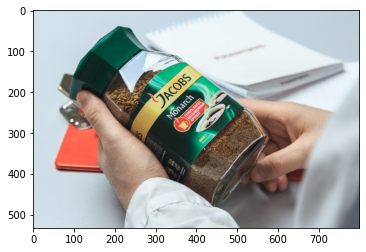

In [434]:
#!M
plt.imshow(array)

/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'str'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'builtin_function_or_method'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping walk through <class 'numpy.float64'>
Walking trough too many objects
Use %enable_full_walk to serialize all variables correctly
  {name: self._state[name] for name in self._state.varnames() if not self._skip_variable(name)}
/kernel/lib/python3.7/site-packages/ipystate/state.py:135: UserWarning: Skipping w

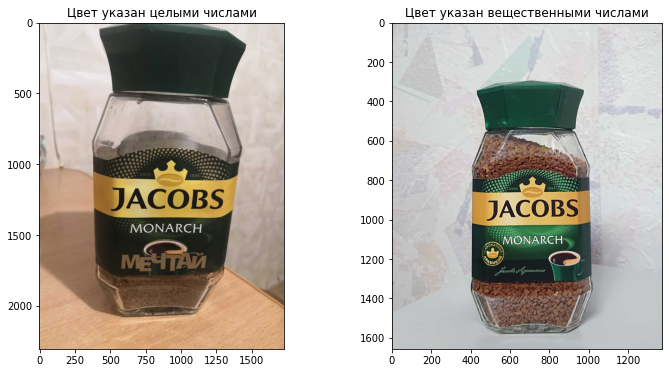

In [438]:
#!M
fig, axes = plt.subplots(1, 2)

array1 = url_to_image('https://storage.yandexcloud.net/images.ratengoods.com/1/717320e6427d936ec66f5180e2fd9c6c1bf9e151.jpeg')
array2 = url_to_image('https://storage.yandexcloud.net/images.ratengoods.com/1/2926bfada2314ab67d896352629a5c999a3aeff0.jpeg')

axes[0].imshow(array1)
axes[0].set_title('Цвет указан целыми числами')

axes[1].imshow(array2)
axes[1].set_title('Цвет указан вещественными числами')

fig.set_figwidth(12) 
fig.set_figheight(6)

100%|██████████| 32/32 [00:09<00:00,  3.22it/s]


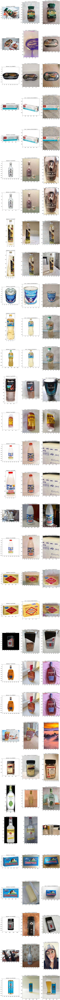

In [545]:
#!M
fig, axes = plt.subplots(len(User_links.keys()), 3)

i=0

for key_not_user in tqdm(list(User_links.keys())):
    
    key_user1 = User_links[key_not_user][1][0]
    key_user2 = User_links[key_not_user][0][0]
    
    distance_user1 = User_links[key_not_user][1][1]
    distance_user2 = User_links[key_not_user][0][1]
    
    array0 = url_to_image(key_not_user)
    array1 = url_to_image(key_user1)
    array2 = url_to_image(key_user2)

    axes[i][0].imshow(array0)
    axes[i][0].set_title(f'Оригинал   key: {list(best2.keys())[i]}')

    axes[i][1].imshow(array1)
    axes[i][1].set_title(f'топ-1   Схожесть {1-distance_user1} %')
    
    axes[i][2].imshow(array2)
    axes[i][2].set_title(f'топ-2   Схожесть {1-distance_user2} %')
    
    i+=1

fig.set_figwidth(18) 
fig.set_figheight(10*len(User_links.keys())) 

plt.show()

In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M
data_top10 = pd.read_csv('data_top_DTCs.csv')

In [ ]:
#!M
data_top10_notUser = data_top10[data_top10.source != 'USER']
data_top10_notUser = data_top10_notUser.reset_index().drop(columns=['index'])
data_top10_notUser

In [ ]:
#!M
data_top10_User = data_top10[data_top10.source == 'USER']
data_top10_User = data_top10_User.reset_index().drop(columns=['index'])
data_top10_User

In [ ]:
#!M
DCTs = {}

k = 0

for prod_id in data_top_notUser.prod_id.unique():
    
    print('GLOBAL PERC: ',k/len(data_top_notUser.prod_id.unique()))
    
    for i, DCT1 in enumerate(data_top_notUser[data_top_notUser.prod_id == prod_id].DCTs.values):

        print('Not User perc: ', (i)/len(data_top_notUser[data_top_notUser.prod_id == prod_id].links.values))

        if data_top_notUser.key[i] not in DCTs: 
            DCTs[data_top_notUser.key[i]] = {}

        j = 0

        for DCT2 in tqdm(data_top_User[data_top_User.prod_id == prod_id].DCTs.values):

            if data_top_User.key[j] not in DCTs[data_top_notUser.key[i]]: 
                DCTs[data_top_notUser.key[i]][data_top_User.key[j]] = distances(DCT1, DCT2)

            j+=1
    k+=1

In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M
